In [1]:
import json
import pandas as pd
import matplotlib.pyplot as plt

from icevision.all import *

In [41]:
parser = parsers.COCOBBoxParser(annotations_filepath='../mixed_annotations.json',
                                img_dir='../')

In [5]:
train_records, valid_records = parser.parse()

  0%|          | 0/7637 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/4288 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 3721) - Clipping bbox ymin from -1.0 to 0 (Before: (<BBox (xmin:1003.0, ymin:-1.0, xmax:1790.0, ymax:410.0)>)) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 3724) - Clipping bbox ymin from -1.0 to 0 (Before: (<BBox (xmin:1408.0, ymin:-1.0, xmax:1777.0, ymax:470.0)>)) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 3821) - Clipping bbox ymin from -1.0 to 0 (Before: (<BBox (xmin:0.0, ymin:-1.0, xmax:1352.0, ymax:2363.0)>)) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 3890) - Clipping bbox xmin from -1.0 to 0 (Before: <BBox (xmin:-1.0, ymin:366.0, xmax:197.0, ymax:673.0)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 4069) - Clipping bbox ymin from -1.0 to 0 (Before: (<BBox (xmin:799.0, ymin:-1.0, xmax:1291.0, ymax:483.0)>)) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 4161) - Clipping bbox ymin from -1.3166667

In [6]:
parser.class_map

<ClassMap: {'background': 0, 'Waste': 1}>

In [7]:
# Transforms
# size is set to 384 because EfficientDet requires its inputs to be divisible by 128
image_size = 512
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [8]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

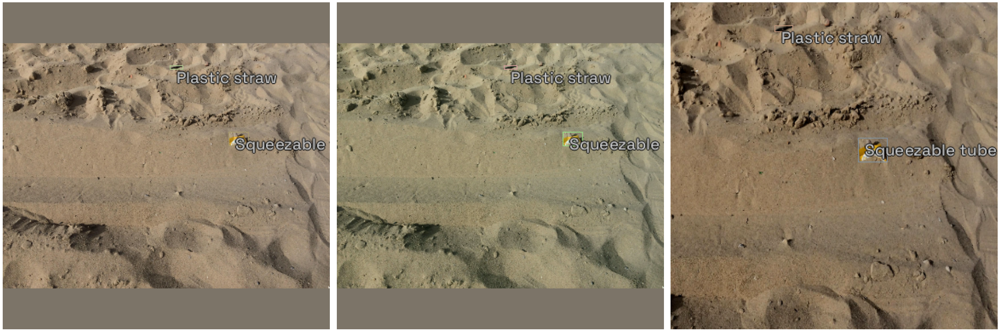

In [7]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3)
plt.show()

In [10]:
extra_args = {}
model_type = models.ross.efficientdet
backbone = model_type.backbones.d0
# The efficientdet model requires an img_size parameter
extra_args['img_size'] = image_size

In [11]:
model = model_type.model(backbone=backbone(pretrained=True),
                         num_classes=len(parser.class_map), 
                         **extra_args) 

In [12]:
# Data Loaders
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=4, shuffle=False)

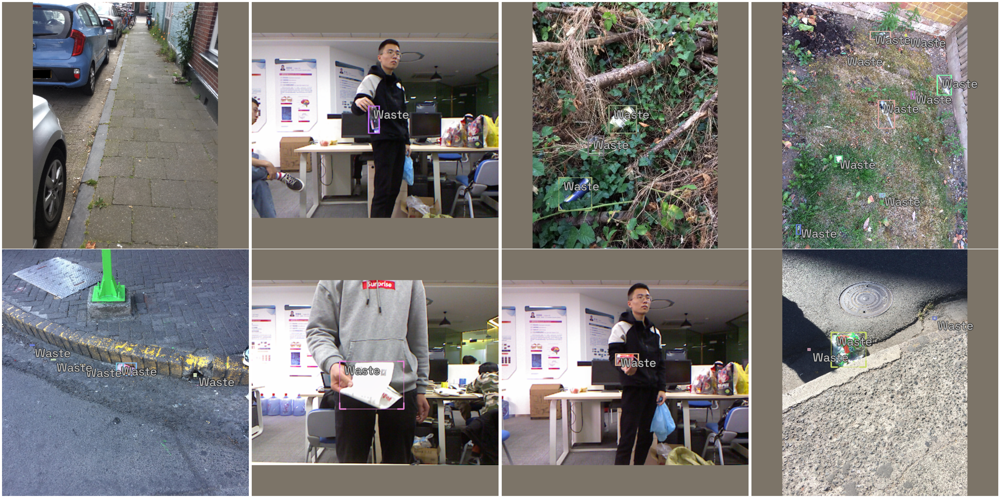

In [13]:
# show batch
model_type.show_batch(first(valid_dl), ncols=4)
plt.show()

In [14]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

class LightModel(model_type.lightning.ModelAdapter):
    def configure_optimizers(self):
        return SGD(self.parameters(), lr=0.001)

light_model = LightModel(model, metrics=metrics)

In [15]:
trainer = pl.Trainer(max_epochs=20, gpus=1)
trainer.fit(light_model, train_dl, valid_dl)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type          | Params
----------------------------------------
0 | model | DetBenchTrain | 3.8 M 
----------------------------------------
3.8 M     Trainable params
0         Non-trainable params
3.8 M     Total params
15.303    Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

/opt/conda/envs/icevision/lib/python3.8/site-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes
/opt/conda/envs/icevision/lib/python3.8/site-packages/pytorch_lightning/utilities/data.py:59: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 8. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  warning_cache.warn(


Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/opt/conda/envs/icevision/lib/python3.8/site-packages/pytorch_lightning/utilities/data.py:59: UserWarning: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 2. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
  warning_cache.warn(
/opt/conda/envs/icevision/lib/python3.8/site-packages/icevision/core/bbox.py:49: RuntimeWarning: overflow encountered in float_scalars
  return self.width * self.height


Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

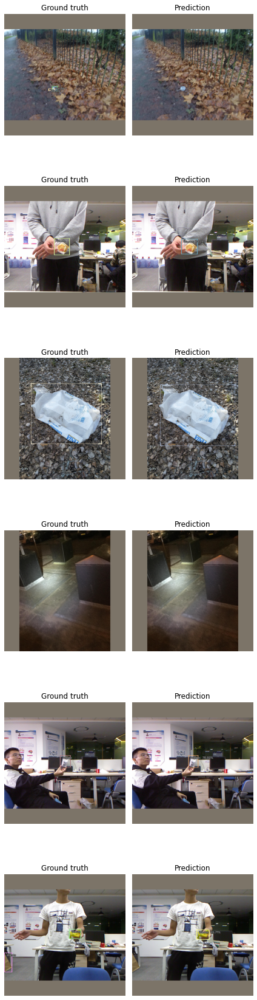

In [19]:
model_type.show_results(model, valid_ds, detection_threshold=.5)
plt.show()

## Inference

In [5]:
import collections
import cv2
import PIL

In [6]:
extra_args = {}
model_type = models.ross.efficientdet
backbone = model_type.backbones.d0
# The efficientdet model requires an img_size parameter
extra_args['img_size'] = 512

In [7]:
model = model_type.model(backbone=backbone(pretrained=True),
                         num_classes=2, 
                         **extra_args) 

In [8]:
ckpt = torch.load('checkpoint.ckpt')

In [9]:
ckpt.keys()

dict_keys(['epoch', 'global_step', 'pytorch-lightning_version', 'state_dict', 'callbacks', 'optimizer_states', 'lr_schedulers'])

In [10]:
fixed_state_dict = collections.OrderedDict()

for k, v in ckpt['state_dict'].items():
    new_k = k[6:]
    fixed_state_dict[new_k] = v

In [11]:
model.load_state_dict(fixed_state_dict)

<All keys matched successfully>

In [19]:
class_map = ClassMap(classes=['Waste'])

In [29]:
img_path = 'ejemplo-basura.jpg'
transforms = tfms.A.Adapter([*tfms.A.resize_and_pad(512), tfms.A.Normalize()])

In [32]:
img = cv2.imread(img_path, cv2.IMREAD_COLOR)

In [ ]:
from icevision.models.checkpoint import model_from_checkpoint

In [ ]:
# The model is automatically recreated in the evaluation mode. To unset that mode, you only need to pass `eval_mode=Fales`)
checkpoint_and_model = model_from_checkpoint('checkpoint.ckpt', 
                                             model_name='ross.efficientdet', 
                                             backbone_name='d0',
                                             img_size=512, 
                                             is_coco=True)

In [21]:
img = PIL.Image.open('basura.jpg')
class_map = ClassMap(classes=['Waste'])
transforms = tfms.A.Adapter([*tfms.A.resize_and_pad(512), tfms.A.Normalize()])

pred_dict  = model_type.end2end_detect(img, transforms, model, class_map=class_map, detection_threshold=0.5, return_as_pil_img=False, return_img=True,
                                      display_bbox=False, display_score=False, display_label=False)

/opt/conda/envs/icevision/lib/python3.8/site-packages/effdet/bench.py:45: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  indices_all = cls_topk_indices_all // num_classes


In [23]:
boxes = [box.to_tensor() for box in pred_dict['detection']['bboxes']]
boxes = torch.stack(boxes)

scores = torch.as_tensor(pred_dict['detection']['scores'])
labels = torch.as_tensor(pred_dict['detection']['label_ids'])
image = np.array(pred_dict['img'])

In [24]:
fixed_boxes = torchvision.ops.batched_nms(boxes, scores, labels, 0.1)

In [27]:
def plot_img_no_mask(image, boxes, categories):
    # Show image
    
    # Remember Pytorch uses (height, width) so we must transpose the image
    #image = torch.transpose(img, 0, 2)
    #image = torch.transpose(image, 0, 1)
    boxes = boxes.cpu().detach().numpy().astype(np.int32)
    fig,ax = plt.subplots(1, 1, figsize=(12, 6))

    for i, box in enumerate(boxes):            
        [x1, y1, x2, y2] = np.array(box).astype(int)
        # Si no se hace la copia da error en cv2.rectangle
        image = np.array(image).copy()

        pt1 = (x1, y1)
        pt2 = (x2, y2)
        cv2.rectangle(image, pt1, pt2, (220,0,0), thickness=5)
        #cv2.putText(image, str(i), (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36,255,12))

    ax.imshow(image)
    plt.show()

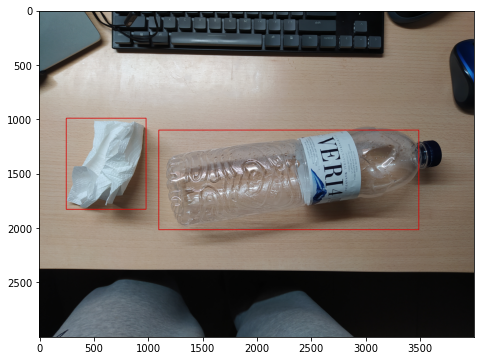

In [28]:
plot_img_no_mask(image, boxes[:2, :], labels)